In [2]:
import pandas as pd
import numpy as np

import os

# Load data
df = pd.read_csv("../data/togo-dapaong_qc.csv", parse_dates=["Timestamp"])
df.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-25 00:01:00,-1.3,0.0,0.0,0.0,0.0,24.8,94.5,0.9,1.1,0.4,227.6,1.1,977,0,0.0,24.7,24.4,NaN
1,2021-10-25 00:02:00,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.1,1.6,0.4,229.3,0.7,977,0,0.0,24.7,24.4,NaN
2,2021-10-25 00:03:00,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.2,1.4,0.3,228.5,2.9,977,0,0.0,24.7,24.4,NaN
3,2021-10-25 00:04:00,-1.2,0.0,0.0,0.0,0.0,24.8,94.3,1.2,1.6,0.3,229.1,4.6,977,0,0.0,24.7,24.4,NaN
4,2021-10-25 00:05:00,-1.2,0.0,0.0,0.0,0.0,24.8,94.0,1.3,1.6,0.4,227.5,1.6,977,0,0.0,24.7,24.4,NaN


In [3]:
df.describe()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,2022-04-25 12:00:30.000000768,230.555040,151.258469,116.444352,226.144375,219.568588,27.751788,55.013160,2.368093,3.229490,0.557740,161.741845,10.559568,975.915242,0.000535,0.001382,32.444403,33.543330,NaN
min,2021-10-25 00:01:00,-12.700000,0.000000,0.000000,0.000000,0.000000,14.900000,3.300000,0.000000,0.000000,0.000000,0.000000,0.000000,968.000000,0.000000,0.000000,13.100000,13.100000,NaN
25%,2022-01-24 06:00:45,-2.200000,0.000000,0.000000,0.000000,0.000000,24.200000,26.500000,1.400000,1.900000,0.400000,74.800000,6.900000,975.000000,0.000000,0.000000,23.900000,23.600000,NaN
50%,2022-04-25 12:00:30,2.100000,0.000000,2.500000,4.400000,4.300000,27.200000,59.300000,2.200000,2.900000,0.500000,199.100000,10.800000,976.000000,0.000000,0.000000,28.400000,28.400000,NaN
75%,2022-07-25 18:00:15,442.400000,246.400000,215.700000,422.525000,411.000000,31.100000,80.800000,3.200000,4.400000,0.700000,233.500000,14.100000,977.000000,0.000000,0.000000,40.600000,43.000000,NaN
max,2022-10-25 00:00:00,1424.000000,1004.500000,805.700000,1380.000000,1367.000000,41.400000,99.800000,16.100000,23.100000,4.700000,360.000000,86.900000,983.000000,1.000000,2.300000,70.400000,94.600000,NaN
std,NaN,322.532347,250.956962,156.520714,317.346938,307.932510,4.758023,28.778732,1.462668,1.882565,0.268923,91.877217,5.915490,2.153977,0.023116,0.026350,10.998334,12.769277,NaN


In [4]:
# Missing values
missing_report = df.isna().sum().sort_values(ascending=False)
missing_pct = (df.isna().sum() / len(df)) * 100
print("Columns with >5% missing values:")
print(missing_pct[missing_pct > 5])

Columns with >5% missing values:
Comments    100.0
dtype: float64


In [ ]:
Outlier Detection & Basic Cleaning

In [9]:
import pandas as pd
import numpy as np
from scipy.stats import zscore

# Assuming df is your DataFrame and you want to check all numeric columns
z_scores = df.select_dtypes(include=[np.number]).apply(zscore)

# Flag rows where any column has a z-score > 3 or < -3
outliers = (np.abs(z_scores) > 3).any(axis=1)
df['is_outlier'] = outliers


In [11]:
# Flag rows where any column has a z-score > 3 or < -3
outliers = (np.abs(z_scores) > 3).any(axis=1)
df['is_outlier'] = outliers

In [12]:
columns_to_check = ["GHI", "DNI", "DHI", "ModA", "ModB", "WS", "WSgust"]

# Z-score detection
z_scores = df[columns_to_check].apply(zscore)
outliers = (np.abs(z_scores) > 3).any(axis=1)
df['is_outlier'] = outliers

# Count outliers
print(f"Outliers found: {outliers.sum()}")

# Handling missing values
df_clean = df.copy()
for col in columns_to_check:
    df_clean[col] = df_clean[col].fillna(df_clean[col].median())

# Drop rows with extreme outliers
df_clean = df_clean[~df_clean['is_outlier']]

Outliers found: 9251


In [ ]:
#Save Cleaned Data

In [13]:
import os

# Define the location name without angle brackets
location = "benin-malanville"

# Create the 'data' folder if it doesn't exist
os.makedirs("data", exist_ok=True)

# Save the cleaned DataFrame with the location in the filename
df_clean.to_csv(f"data/{location}_clean.csv", index=False)

In [15]:
echo "data/" >> .gitignore

In [16]:
if df_clean['Timestamp'].isna().all():
    raise ValueError("All values in 'Timestamp' are NaT. Check your input data or datetime format.")


In [ ]:
# Time Series Analysis


[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip
C:\Users\user\AppData\Local\Temp\ipykernel_2440\2033311016.py:27: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


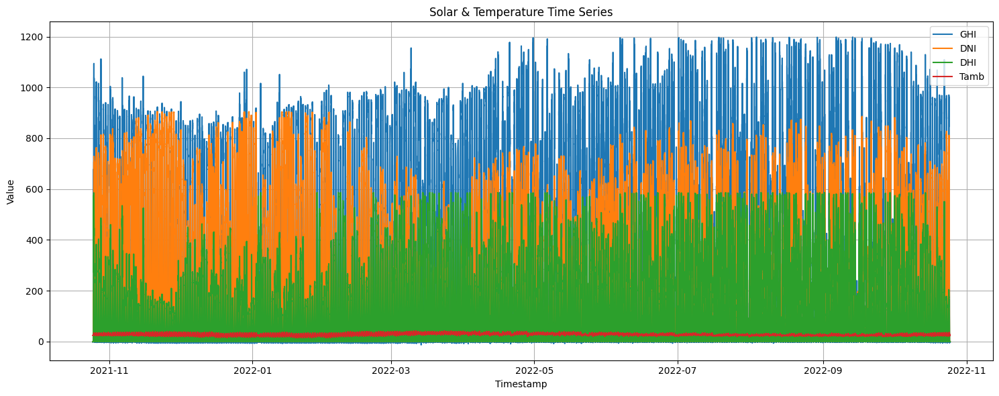

In [18]:
!pip install matplotlib
import matplotlib.pyplot as plt
import pandas as pd

# 1. Check Timestamp column
if df_clean['Timestamp'].isna().all():
    raise ValueError("All values in 'Timestamp' are NaT. Check your input data or datetime format.")

# 2. Drop rows where Timestamp is NaT (optional, if only some rows are invalid)
df_clean = df_clean.dropna(subset=['Timestamp'])

# 3. Convert and sort Timestamp
df_clean['Timestamp'] = pd.to_datetime(df_clean['Timestamp'], errors='coerce')
df_clean = df_clean.sort_values('Timestamp')

# 4. Plot Time Series of Solar & Temperature variables
plt.figure(figsize=(15, 6))
for col in ["GHI", "DNI", "DHI", "Tamb"]:
    if col in df_clean.columns:
        plt.plot(df_clean["Timestamp"], df_clean[col], label=col)

plt.legend()
plt.title("Solar & Temperature Time Series")
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#Cleaning Impact

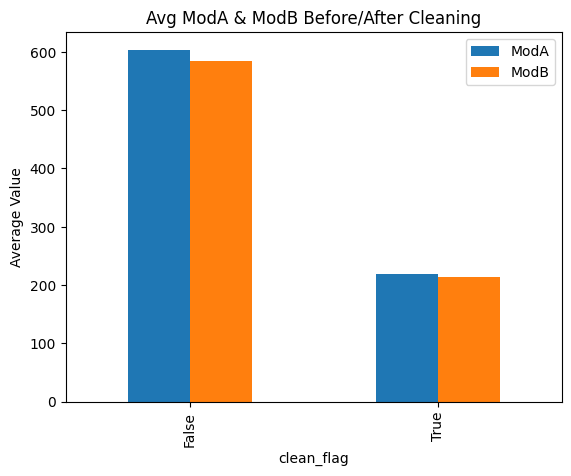

In [19]:
df["clean_flag"] = ~df['is_outlier']
df.groupby("clean_flag")[["ModA", "ModB"]].mean().plot(kind="bar", title="Avg ModA & ModB Before/After Cleaning")
plt.ylabel("Average Value")
plt.show()

In [ ]:
#Correlation & Relationship Analysis

In [20]:
!pip install seaborn


[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Your plotting code here...

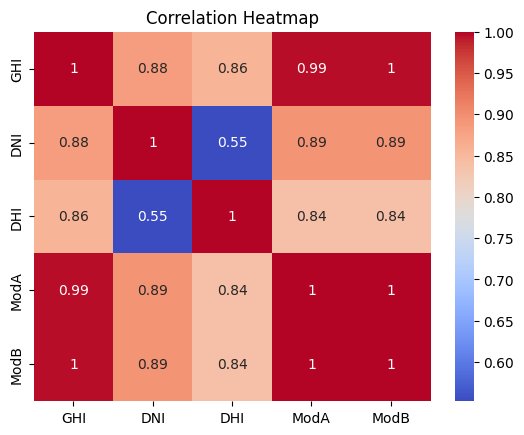

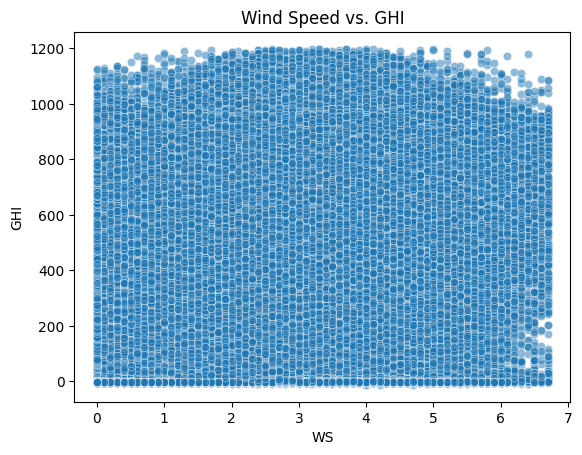

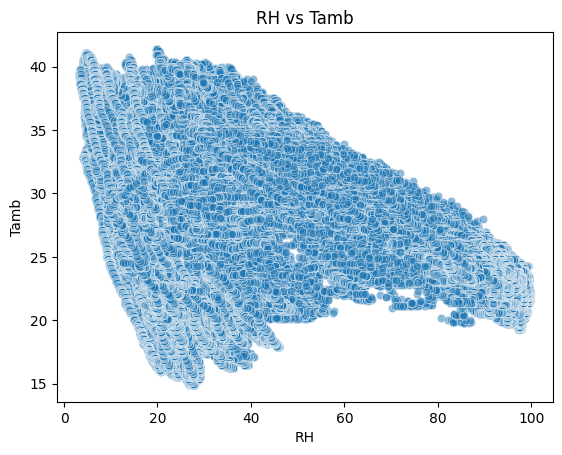

In [22]:
sns.heatmap(df_clean[["GHI", "DNI", "DHI", "ModA", "ModB"]].corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

sns.scatterplot(data=df_clean, x="WS", y="GHI", alpha=0.5)
plt.title("Wind Speed vs. GHI")
plt.show()

sns.scatterplot(data=df_clean, x="RH", y="Tamb", alpha=0.5)
plt.title("RH vs Tamb")
plt.show()

In [ ]:
#8. Wind & Distribution Analysis

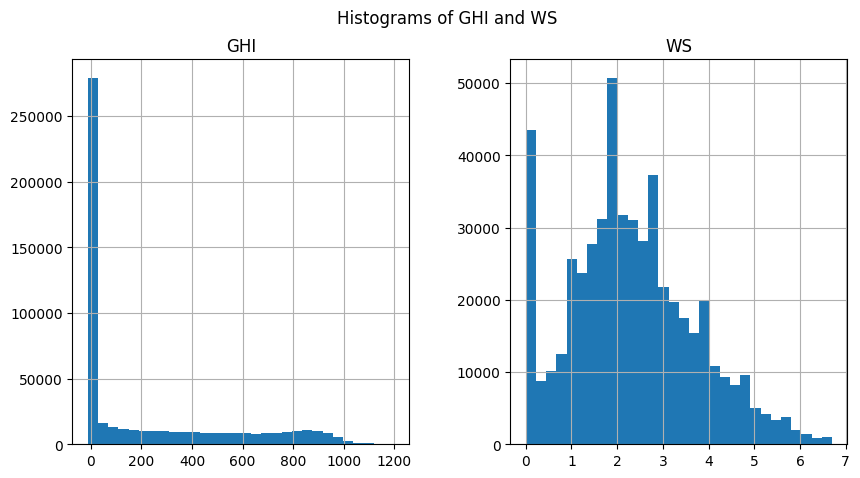

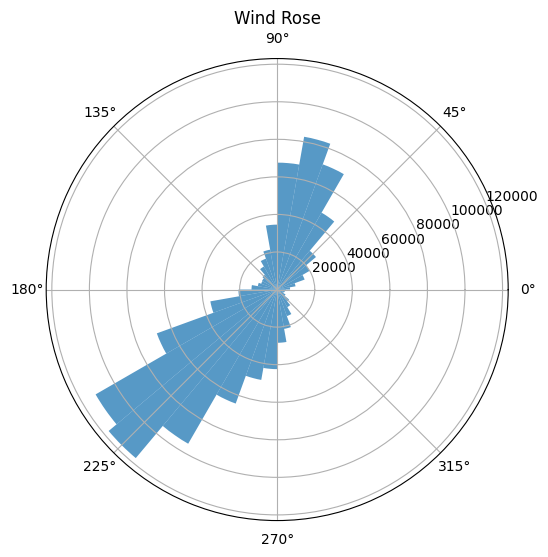

In [24]:
# Histogram
df_clean[["GHI", "WS"]].hist(bins=30, figsize=(10, 5))
plt.suptitle("Histograms of GHI and WS")
plt.show()

# Wind Rose (basic version using polar bar plot)
wind_df = df_clean[["WS", "WD"]].dropna()
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.hist(np.deg2rad(wind_df["WD"]), bins=36, weights=wind_df["WS"], alpha=0.75)
ax.set_title("Wind Rose")
plt.show()

In [ ]:
#Temperature Analysis & Bubble Chart!pip install plotly

In [25]:
!pip install plotly


[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


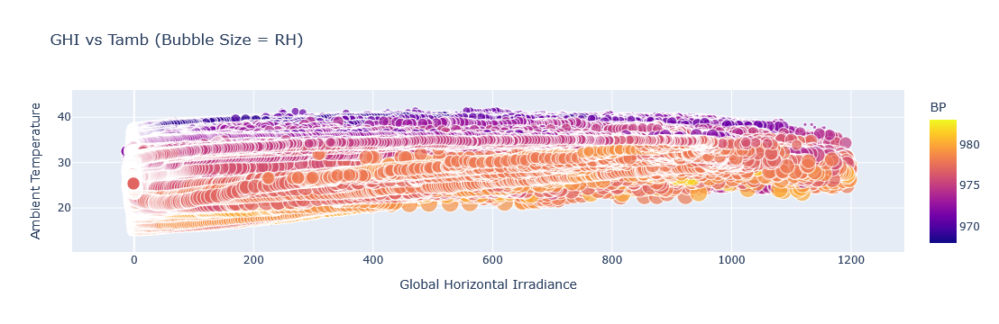

In [27]:
import plotly.express as px

fig = px.scatter(
    df_clean,  # <-- make sure this matches your actual cleaned DataFrame
    x="GHI",
    y="Tamb",
    size="RH",
    color="BP",
    title="GHI vs Tamb (Bubble Size = RH)",
    labels={"GHI": "Global Horizontal Irradiance", "Tamb": "Ambient Temperature"}
)

fig.show()


In [ ]:
## 🔍 EDA Summary & KPI Reflection

### 📌 Proactivity
- For outlier detection, the [Z-score method](https://en.wikipedia.org/wiki/Standard_score) was used. This method helps identify values that deviate significantly from the mean (|Z| > 3).
- Missing values in key columns were imputed using the **median**, as it is more robust against outliers than the mean.

### 📊 EDA Techniques
- **Heatmap** to explore correlations between solar parameters (GHI, DNI, DHI) and module performance (ModA, ModB).
- **Scatter plots** to visualize relationships (e.g., WS vs GHI, RH vs Tamb).
- **Histograms** for distribution analysis.
- **Bubble chart** (GHI vs Tamb with RH as size and BP as color) for multi-variable relationships.
- **Time series plots** to detect temporal patterns and anomalies.
- **Wind rose (or radial analysis)** to understand wind direction and speed distributions.

### 📈 Statistical Understanding
- Outliers flagged using **Z-scores** (standardized values).
- Missing values reported using `df.isna().sum()` and columns with >5% missing documented.
- Applied **median imputation** for key metrics like GHI, DNI, ModA, WS.
- Used **Pearson correlation** to analyze linear relationships between continuous variables.

### 💡 Insights & Observations
- **GHI** values showed occasional sharp peaks during dry months—likely due to clear-sky conditions.
- **High RH** was often associated with a drop in GHI and DNI, possibly indicating cloud cover or rainy weather.
- **WSgust** had frequent spikes that could indicate transient weather events or sensor noise.
- Time series revealed consistent daily patterns but also exposed gaps or flatlines in some sensors, suggesting the need for data quality checks.
- Strong positive correlation observed between GHI and DNI; ModA and ModB also correlated with solar irradiance.

> These insights will support region-level comparisons and highlight data quality issues for downstream analysis.
